In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_masks.npy')

In [3]:
X_test = images[1700:2141]
y_test = masks[1700:2141]

In [4]:
images = images[0:1700]
masks = masks[0:1700]

In [5]:
barebone_model = '/tmp/tmp7h8stef3kuc_unet2d/kuc_unet2d_0kuc_unet2d_model'

In [6]:
images.shape

(1700, 512, 512, 1)

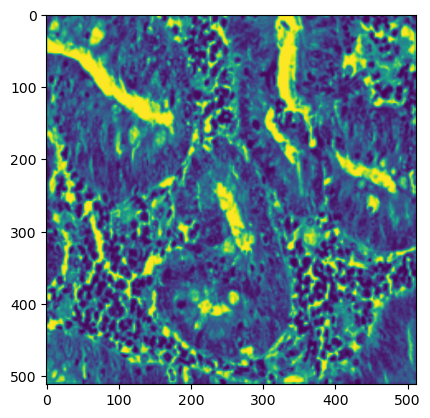

In [7]:
imshow(images[100])

In [8]:
masks.shape

(1700, 512, 512, 1)

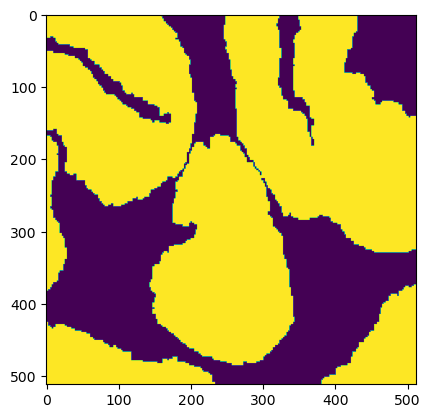

In [9]:
imshow(masks[100])

In [10]:
import sys
sys.path.append('../')
import gp2

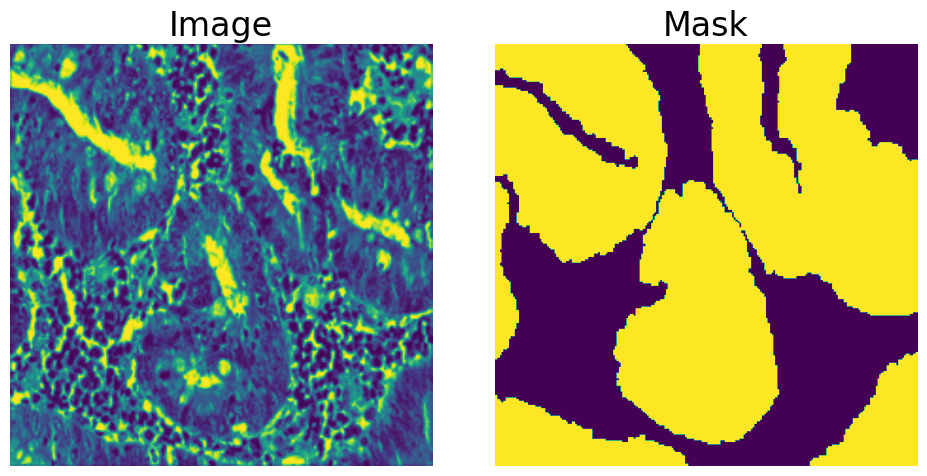

In [11]:
plt.rcParams['font.size'] = 20
gp2.Util.display_image_and_mask(images[100], masks[100])

In [11]:
from keras import losses

In [12]:
loss_fx = losses.BCE

In [13]:
C = gp2.KUC_UNet2D(loss=loss_fx, model_path=barebone_model)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmp1mbmii6ukuc_unet2d


In [14]:
from runner import Runner
R = Runner(verbose=True, workingdir=C.workingdir)

*** GP2 ***
Working directory: /tmp/tmp1mbmii6ukuc_unet2d
Verbose mode active!


In [15]:
R.classifier = C ### use custom classifier

In [16]:
R.run(images, masks, runs=5, batch_size=16, shuffle=True, results_file='/raid/mpsych/OMAMA/GP2/results/kuc_unet2d_0kuc_unet2d_model_1_5_EBHI_filtered.pkl')

Shuffling data...
Weights OK!
******
Loop 1
Epoch 1/100
6/6 [==============================] - 24s 2s/step - loss: 0.2982 - dice_coeff: 0.8730 - val_loss: 0.2988 - val_dice_coeff: 0.8477
Epoch 2/100
6/6 [==============================] - 3s 475ms/step - loss: 0.2658 - dice_coeff: 0.8799 - val_loss: 0.3179 - val_dice_coeff: 0.8727
Epoch 3/100
6/6 [==============================] - 3s 470ms/step - loss: 0.2600 - dice_coeff: 0.8890 - val_loss: 0.2936 - val_dice_coeff: 0.8601
Epoch 4/100
6/6 [==============================] - 3s 469ms/step - loss: 0.2607 - dice_coeff: 0.8905 - val_loss: 0.3004 - val_dice_coeff: 0.8672
Epoch 5/100
6/6 [==============================] - 3s 471ms/step - loss: 0.2594 - dice_coeff: 0.8832 - val_loss: 0.2904 - val_dice_coeff: 0.8715
Epoch 6/100
6/6 [==============================] - 3s 474ms/step - loss: 0.2527 - dice_coeff: 0.8871 - val_loss: 0.2897 - val_dice_coeff: 0.8736
Epoch 7/100
6/6 [==============================] - 3s 480ms/step - loss: 0.2497 - dice_c

In [17]:
R.classifier_scores

[[0.29038897156715393, 0.8727321028709412],
 [0.29055801033973694, 0.8678130507469177],
 [0.3149856925010681, 0.8551461100578308],
 [0.30367252230644226, 0.8620724081993103],
 [0.3274189829826355, 0.8792901039123535]]

In [18]:
R.discriminator_scores

[[0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0], [0.0, 1.0]]

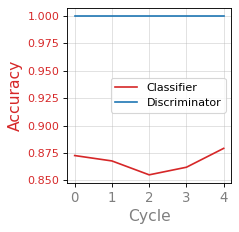

In [19]:
R.plot()

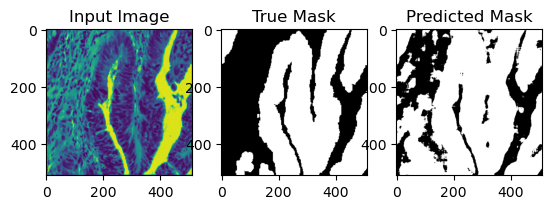

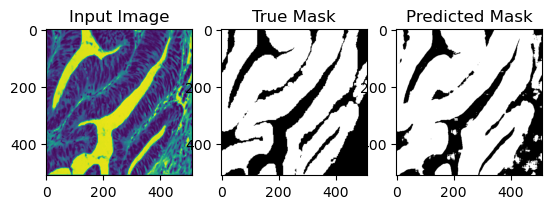

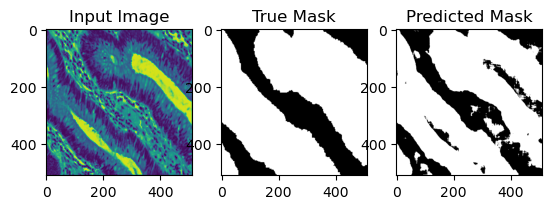

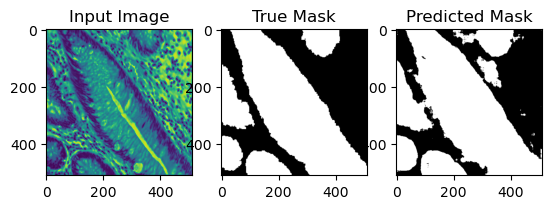

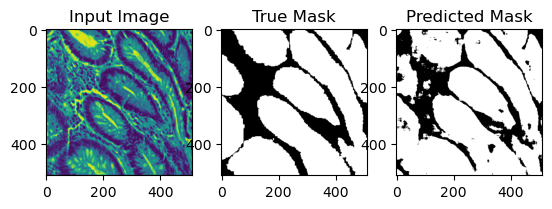

...

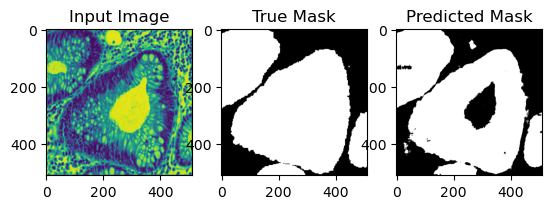

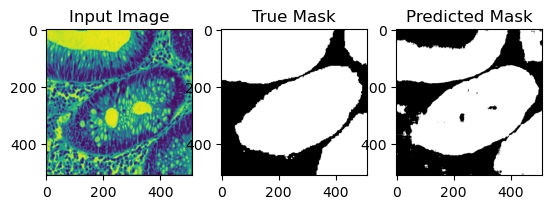

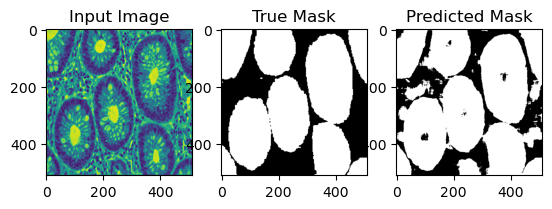

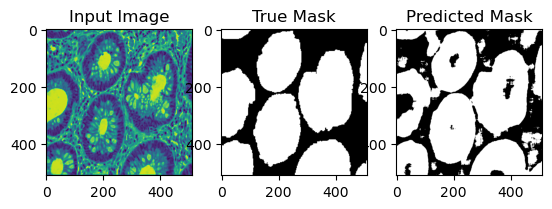

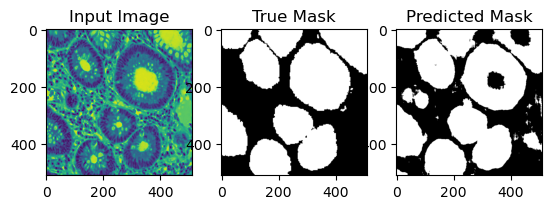

In [20]:
gp2.Util.visualize_predictions(C, X_test, y_test, num_samples=100)

In [21]:
y_pred = R.classifier.predict(X_test, y_test)

In [22]:
y_pred

(array([[[[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         ...,
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]]],
 
 
        [[[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
      

In [23]:
BareBone = gp2.KUC_UNet2D(loss=loss_fx, model_path=barebone_model)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmp1mbmii6ukuc_unet2d


In [24]:
barebone_pred = BareBone.predict(X_test, y_test)

In [25]:
barebone_pred

(array([[[[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         ...,
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]]],
 
 
        [[[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
      

In [26]:
BareBone.model.metrics_names

['loss', 'dice_coeff']